In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
!unzip "/content/drive/MyDrive/bitirmeNB/dataset.zip"

Archive:  /content/drive/MyDrive/bitirmeNB/dataset.zip
   creating: dataset/
   creating: dataset/test/
  inflating: dataset/test/0242.jpg   
  inflating: dataset/test/0242.json  
  inflating: dataset/test/0243.jpg   
  inflating: dataset/test/0243.json  
  inflating: dataset/test/0245.jpg   
  inflating: dataset/test/0245.json  
  inflating: dataset/test/0246.jpg   
  inflating: dataset/test/0246.json  
  inflating: dataset/test/0247.jpg   
  inflating: dataset/test/0247.json  
  inflating: dataset/test/0248.jpg   
  inflating: dataset/test/0248.json  
  inflating: dataset/test/0249.jpg   
  inflating: dataset/test/0249.json  
  inflating: dataset/test/0250.jpg   
  inflating: dataset/test/0250.json  
  inflating: dataset/test/0251.jpg   
  inflating: dataset/test/0251.json  
  inflating: dataset/test/0252.jpg   
  inflating: dataset/test/0252.json  
  inflating: dataset/test/0253.jpg   
  inflating: dataset/test/0253.json  
  inflating: dataset/test/0254.jpg   
  inflating: dataset/t

In [4]:
!pip install pyyaml==5.1
!pip install torch==1.8.0+cu101 torchvision==0.9.0+cu101 -f https://download.pytorch.org/whl/torch_stable.html

     |████████████████████████████████| 274 kB 5.3 MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp37-cp37m-linux_x86_64.whl size=44092 sha256=1943f6a006c62d3dd205d47b5fbf9cb00efd6f0ca4efb888487447ab630aa6a4
  Stored in directory: /root/.cache/pip/wheels/77/f5/10/d00a2bd30928b972790053b5de0c703ca87324f3fead0f2fd9
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
Looking in links: https://download.pytorch.org/whl/torch_stable.html
     |████████████████████████████████| 763.5 MB 15 kB/s 
     |████████████████████████████████| 17.3 MB 1.8 MB/s 
  Attempting uninstall: torch
    Found existing installation: torch 1.10.0+cu111
    Uninstalling torch-1.10.0+cu111:
      Successfully uninstalled torch-1.10.0+cu111
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.11.1+cu111
    Uninstalling torchvision-0.11.1+cu111:
      Succe

In [5]:
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.8/index.html

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.8/index.html
     |████████████████████████████████| 6.3 MB 790 kB/s 
     |████████████████████████████████| 55 kB 2.7 MB/s 
     |████████████████████████████████| 145 kB 10.6 MB/s 
     |████████████████████████████████| 130 kB 43.0 MB/s 
     |████████████████████████████████| 74 kB 3.1 MB/s 
     |████████████████████████████████| 843 kB 40.2 MB/s 
     |████████████████████████████████| 748 kB 43.7 MB/s 
     |████████████████████████████████| 112 kB 50.9 MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.5.post20220119-py3-none-any.whl size=65267 sha256=59538739629e811432359f88cfe6258da93b30abd69f4f1cd80ebd61b5727b60
  Stored in directory: /root/.cache/pip/wheels/f3/b8/eb/61ed840f80d7198725bc061872b6019a7b3e9db4dbadf68083
  Created wheel for antlr4-python3-runtime: filename=antlr4_python3_runtime-4.8-py3-none-any.whl size=141230 sha256=75d6b6ac6fd1a1b90c76e8607d31896c2ec707680c9315613b803ff17bb2de

In [6]:
import torch
assert torch.__version__.startswith("1.8") 
import torchvision
import cv2
import os
import numpy as np
import json
import random
import matplotlib.pyplot as plt
%matplotlib inline
from detectron2.structures import BoxMode
from detectron2.data import DatasetCatalog, MetadataCatalog

In [7]:
def get_data_dicts(directory, classes):
    dataset_dicts = []
    for filename in [file for file in os.listdir(directory) if file.endswith('.json')]:
        json_file = os.path.join(directory, filename)
        with open(json_file) as f:
            img_anns = json.load(f)

        record = {}
        
        filename = os.path.join(directory, img_anns["imagePath"])
        
        record["file_name"] = filename
        record["height"] = 1000
        record["width"] = 1000
      
        annos = img_anns["shapes"]
        objs = []
        for anno in annos:
            px = [a[0] for a in anno['points']] # x coord
            py = [a[1] for a in anno['points']] # y-coord
            poly = [(x, y) for x, y in zip(px, py)] # poly for segmentation
            poly = [p for x in poly for p in x]

            obj = {
                "bbox": [np.min(px), np.min(py), np.max(px), np.max(py)],
                "bbox_mode": BoxMode.XYXY_ABS,
                "category_id": classes.index(anno['label']),
                "iscrowd": 0
            }
            objs.append(obj)
        record["annotations"] = objs
        dataset_dicts.append(record)
    return dataset_dicts

In [8]:
classes = ['drone']

data_path = '/content/dataset/'

for d in ["train", "test"]:
    DatasetCatalog.register(
        "my_" + d, 
        lambda d=d: get_data_dicts(data_path+d, classes)
    )
    MetadataCatalog.get("my_" + d).set(thing_classes=classes)

microcontroller_metadata = MetadataCatalog.get("my_train")

In [9]:
from detectron2 import model_zoo
from detectron2.engine import DefaultTrainer, DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import ColorMode, Visualizer
from matplotlib.patches import Rectangle

In [10]:
cfg = get_cfg() # Yapılandırma Dosyasını Oluşturuyoruz
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")) # Yapılandırma Dosyasını Çeker ve Yapılandırma Dosyasına Ekler
cfg.DATASETS.TRAIN = ("my_train",) # Train Verilerimiz Yapılandırma Dosyasına Kaydeder
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2 # Çalışan Sayısı
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml") # Ağırlıkları Çeker ve Yapılandırma Dosyasına Ekler
cfg.SOLVER.IMS_PER_BATCH = 4 # Batch Size
cfg.SOLVER.BASE_LR = 0.001 # Learning Rate (Öğrenme Oranı)
cfg.SOLVER.GAMMA = 0.05 # Learning Rate Azaltma Çarpımı
cfg.SOLVER.STEPS = [500] # Learning Rate Azaltma Adım Sayısı
cfg.TEST.EVAL_PERIOD = 200 # Eğitim Sırasında Modeli Değerlendirmek İçin Adım Sayısı

cfg.SOLVER.MAX_ITER = 1400 # İterasyon Sayısı
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1 # Sınıf Sayısı
torch.cuda.empty_cache()

In [11]:
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True) # Model Sonucu İçin Klasör Oluşturur
trainer = DefaultTrainer(cfg) # Modeli Train Moduna Geçirir Yapılandırma Dosyası ile Birlikte
trainer.resume_or_load(resume=False) # Model Eğitimine 0'dan Başlamak İçin False Yapıyoruz

[01/27 19:40:52 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_68b088.pkl: 421MB [00:07, 55.5MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (2, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (2,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.box_pre

In [12]:
trainer.train() # Model Eğitimine Başlar

[01/27 19:41:08 d2.engine.train_loop]: Starting training from iteration 0
[01/27 19:42:50 d2.utils.events]:  eta: 2:03:07  iter: 19  total_loss: 1.027  loss_cls: 0.8882  loss_box_reg: 0.116  loss_rpn_cls: 0.005258  loss_rpn_loc: 0.005805  time: 5.0999  data_time: 0.0449  lr: 1.931e-06  max_mem: 7241M
[01/27 19:44:32 d2.utils.events]:  eta: 2:01:27  iter: 39  total_loss: 0.9929  loss_cls: 0.833  loss_box_reg: 0.1329  loss_rpn_cls: 0.002648  loss_rpn_loc: 0.006411  time: 5.0977  data_time: 0.0286  lr: 2.911e-06  max_mem: 7241M
[01/27 19:46:14 d2.utils.events]:  eta: 1:59:35  iter: 59  total_loss: 0.8701  loss_cls: 0.7364  loss_box_reg: 0.1244  loss_rpn_cls: 0.004107  loss_rpn_loc: 0.005364  time: 5.0899  data_time: 0.0248  lr: 3.891e-06  max_mem: 7241M
[01/27 19:47:56 d2.utils.events]:  eta: 1:57:44  iter: 79  total_loss: 0.7862  loss_cls: 0.6439  loss_box_reg: 0.1241  loss_rpn_cls: 0.006463  loss_rpn_loc: 0.006229  time: 5.1008  data_time: 0.0242  lr: 4.871e-06  max_mem: 7241M
[01/27 19

In [13]:
%load_ext tensorboard 
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [14]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth") # Ağırlık Dosyamızı Yapılandırma Dosyamıza Kaydeder
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.58 # Test için Eşik Değerimiz
cfg.DATASETS.TEST = ("my_test", ) # Tets Verilerimiz Yapılandırma Dosyasına Kaydeder
predictor = DefaultPredictor(cfg) #Modeli Test Moduna Geçirir Yapılandırma Dosyası ile Birlikte
test_metadata = MetadataCatalog.get("my_test")
test_dataset_dicts = get_data_dicts(data_path+'test', classes)

In [15]:
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.76

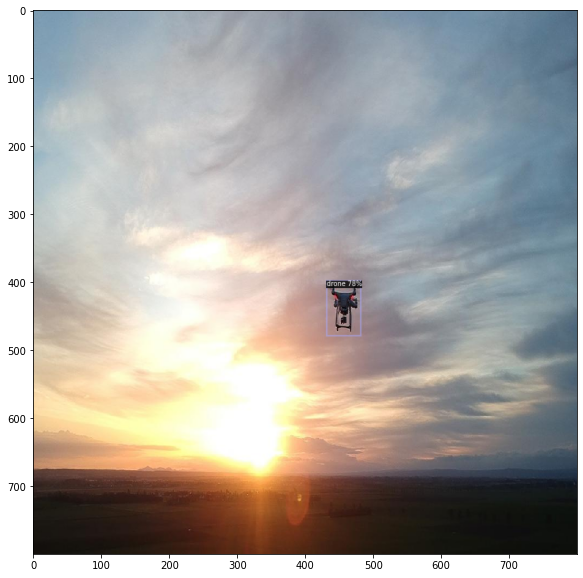

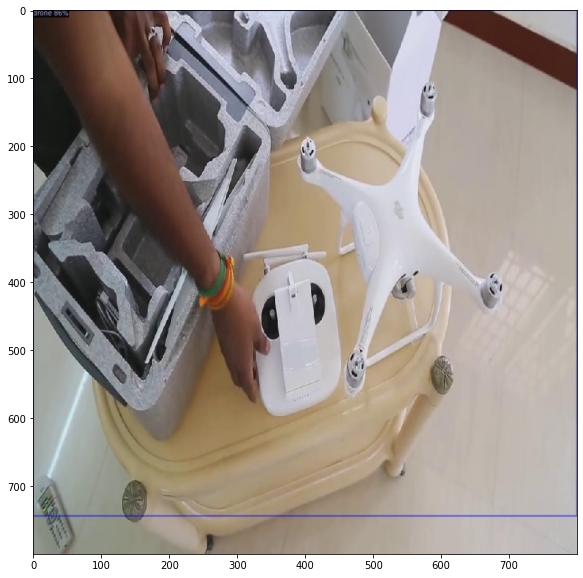

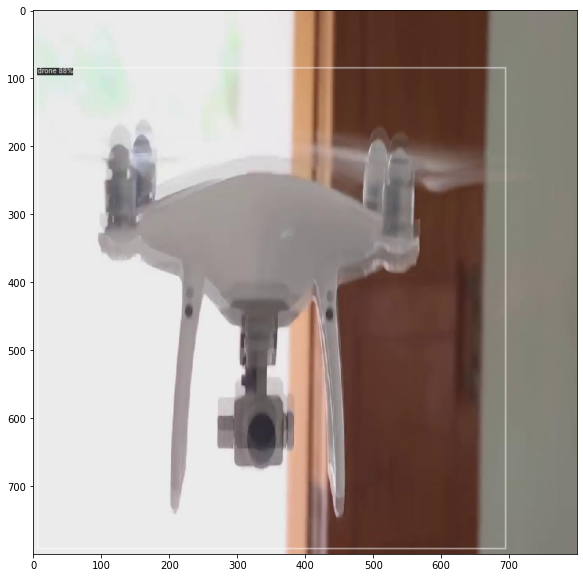

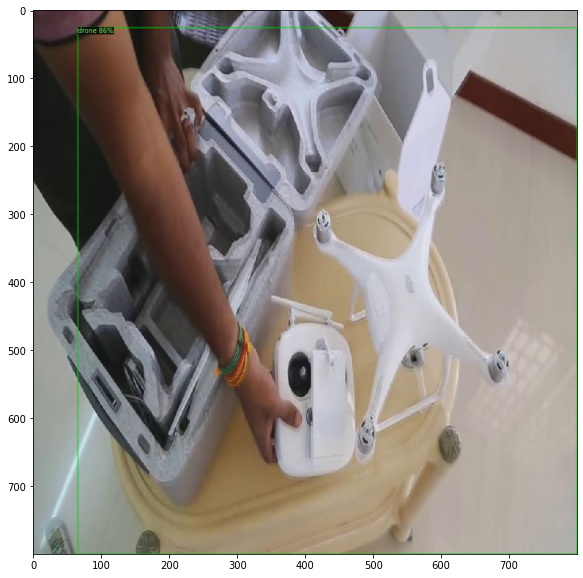

In [16]:
for d in random.sample(test_dataset_dicts, 4):    
    img = cv2.imread(d["file_name"])
    outputs = predictor(img)
    v = Visualizer(img[:, :, ::-1],
                   metadata=microcontroller_metadata, 
                   scale=0.8, 
                   #instance_mode=ColorMode.IMAGE_BW # removes the colors of unsegmented pixels
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.figure(figsize = (20, 10))
    plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    plt.show()

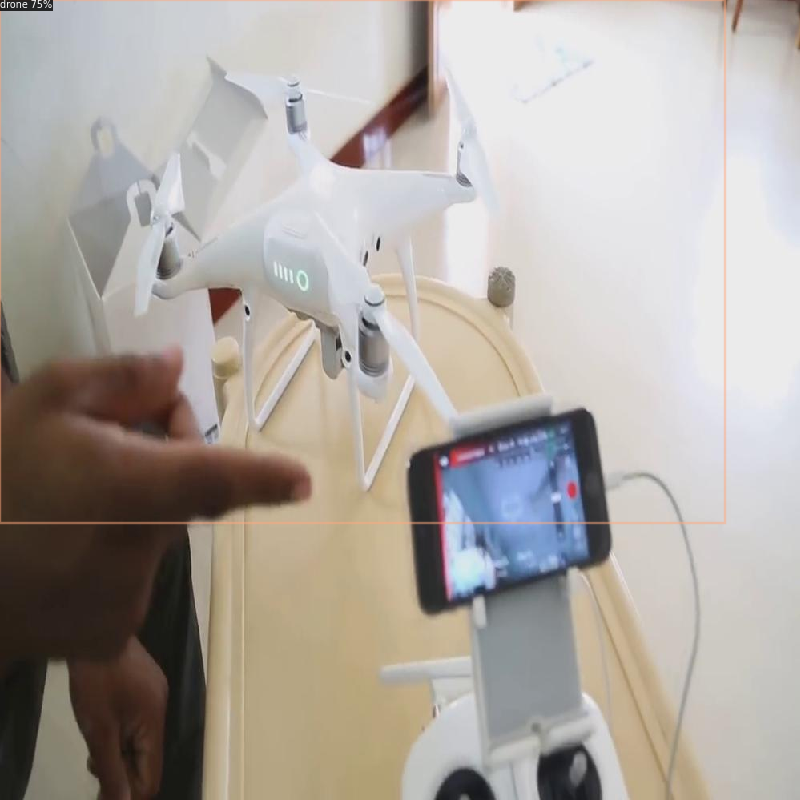

In [17]:
from detectron2.utils.visualizer import ColorMode
import glob
from google.colab.patches import cv2_imshow
for imageName in glob.glob('/content/dataset/test/foto04467.jpg'):
  im = cv2.imread(imageName)
  outputs = predictor(im)
  v = Visualizer(im[:, :, ::-1],
                metadata=test_metadata, 
                scale=0.8
                 )
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2_imshow(out.get_image()[:, :, ::-1])